In [1]:
import pandas as pd

In [2]:
from backtesting import Strategy
from backtesting.lib import crossover

C:\Users\antho\Anaconda3\lib\site-packages\backtesting\_plotting.py:44: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


Loading BokehJS ...

In [3]:
from backtesting import Backtest

In [4]:
%matplotlib inline
import seaborn as sns
from Price_Data import hist_data

In [5]:
import matplotlib.pyplot as plt

In [7]:
btcusd = hist_data('Bitstamp')

C:\Users\antho\Anaconda3\lib\site-packages\pandas\core\generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [8]:
btcusd.columns = ['Open']

In [9]:
ss = btcusd.resample('H')

In [10]:
op = ss.first().ffill()
hi = ss.max().ffill()
lo = ss.min().ffill()
cl = ss.last().ffill()

In [11]:
btcusd

,Open
Date,
2011-09-13 13:53:36,5.80
2011-09-13 13:53:44,5.83
2011-09-13 13:53:49,5.90
2011-09-13 13:53:54,6.00
2011-09-13 14:32:53,5.95
...,...
2019-12-12 23:58:18,7184.44
2019-12-12 23:58:20,7184.44
2019-12-12 23:59:05,7190.53


In [12]:
ohlc = op
ohlc.columns = ['Open']
ohlc['High'] = hi
ohlc['Low'] = lo
ohlc['Close'] = cl
ohlc

,Open,High,Low,Close
Date,,,,
2011-09-13 13:00:00,5.80,6.00,5.80,6.00
2011-09-13 14:00:00,5.95,5.95,5.76,5.76
2011-09-13 15:00:00,5.65,5.65,5.65,5.65
2011-09-13 16:00:00,5.65,5.65,5.65,5.65
2011-09-13 17:00:00,5.65,5.65,5.65,5.65
...,...,...,...,...
2019-12-12 19:00:00,7205.66,7218.00,7186.36,7193.66
2019-12-12 20:00:00,7205.14,7250.23,7195.00,7242.49
2019-12-12 21:00:00,7245.85,7253.68,7180.83,7194.57


In [21]:
DEMA(list(range(12,100)),10)

0     12.000000
1     12.330579
2     12.904583
3     13.655625
4     14.533409
        ...    
83    94.999996
84    95.999997
85    96.999997
86    97.999998
87    98.999998
Length: 88, dtype: float64

In [14]:
def EMA(val,n):
    res = pd.Series(val).copy()
    return res.ewm(span=n,adjust=False).mean()

In [17]:
def DEMA(val,n):
    exp1 = EMA(val,n)
    exp2 = EMA(exp1,n)
    return 2*exp1 - exp2

In [22]:
class DemaCross(Strategy):
    
    n1 = 37
    n2 = 46
    
    def init(self):
        # Precompute two moving averages
        self.dema1 = self.I(DEMA, self.data.Close, self.n1)
        self.dema2 = self.I(DEMA, self.data.Close, self.n2)
        
    def next(self):
        # If sma1 crosses above ema2, buy the asset
        if crossover(self.dema1, self.dema2):
            self.buy()

        # Else, if ema1 crosses below ema2, sell it
        elif crossover(self.dema2, self.dema1):
            self.sell()

In [23]:
bt = Backtest(ohlc,DemaCross,cash=10000)

In [24]:
bt.run()

Start                     2011-09-13 13:00:00
End                       2019-12-12 23:00:00
Duration                   3012 days 10:00:00
Exposure [%]                          99.8644
Equity Final [$]                  3.46349e+06
Equity Peak [$]                   4.12985e+06
Return [%]                            34534.9
Buy & Hold Return [%]                  119707
Max. Drawdown [%]                    -98.8219
Avg. Drawdown [%]                     -4.3241
Max. Drawdown Duration     1063 days 12:00:00
Avg. Drawdown Duration        9 days 10:00:00
# Trades                                 1772
Win Rate [%]                          38.2619
Best Trade [%]                         68.042
Worst Trade [%]                      -95.2174
Avg. Trade [%]                       0.494278
Max. Trade Duration           8 days 01:00:00
Avg. Trade Duration           1 days 17:00:00
Expectancy [%]                         3.5881
SQN                                   1.11835
Sharpe Ratio                      

In [25]:
bt.plot()

In [26]:
data, heat = bt.optimize('Sharpe Ratio',n1=range(1,200,9),n2=range(1,200,9),constraint=lambda p: p.n1<p.n2,return_heatmap=True)

In [27]:
data

Start                         2011-09-13 13:00:00
End                           2019-12-12 23:00:00
Duration                       3012 days 10:00:00
Exposure [%]                              99.7012
Equity Final [$]                      2.95919e+06
Equity Peak [$]                       3.41266e+06
Return [%]                                29491.9
Buy & Hold Return [%]                      119707
Max. Drawdown [%]                        -91.1817
Avg. Drawdown [%]                        -5.66492
Max. Drawdown Duration          594 days 13:00:00
Avg. Drawdown Duration           11 days 12:00:00
# Trades                                      615
Win Rate [%]                              41.3008
Best Trade [%]                             133.26
Worst Trade [%]                          -43.9394
Avg. Trade [%]                            1.42832
Max. Trade Duration              19 days 19:00:00
Avg. Trade Duration               4 days 22:00:00
Expectancy [%]                            6.44779


In [28]:
heat.sort_values()
hmap = heat.groupby(['n1','n2']).mean().unstack()
hmap

n2,10,19,28,37,46,55,64,73,82,91,...,118,127,136,145,154,163,172,181,190,199
n1,,,,,,,,,,,,,,,,,,,,,
1,-0.095242,-0.021738,-0.003915,0.001733,0.013172,0.014033,0.019610,0.016906,0.016180,0.015581,...,0.012499,0.016057,0.016338,0.015900,0.012313,0.003165,0.001267,0.003985,0.003993,0.004630
10,NaN,0.022058,0.032319,0.044626,0.053315,0.052615,0.059145,0.053543,0.050514,0.047088,...,0.044156,0.044355,0.044773,0.040059,0.042515,0.037201,0.033736,0.030570,0.029121,0.035477
19,NaN,NaN,0.055671,0.065753,0.069477,0.059651,0.059480,0.067008,0.077295,0.079634,...,0.053020,0.047953,0.042874,0.053531,0.051230,0.054845,0.042858,0.044361,0.035659,0.044339
28,NaN,NaN,NaN,0.073990,0.075871,0.070662,0.081599,0.096402,0.083954,0.081147,...,0.042411,0.044680,0.060063,0.067488,0.064665,0.060778,0.069269,0.065905,0.066677,0.057599
37,NaN,NaN,NaN,NaN,0.074067,0.092543,0.085166,0.081790,0.068674,0.048319,...,0.081108,0.087068,0.083958,0.083346,0.089567,0.086714,0.067371,0.052064,0.049263,0.061868
46,NaN,NaN,NaN,NaN,NaN,0.080117,0.085931,0.061198,0.080270,0.069587,...,0.091577,0.088325,0.077353,0.086829,0.093410,0.093173,0.088113,0.099521,0.092398,0.080806
55,NaN,NaN,NaN,NaN,NaN,NaN,0.076454,0.074775,0.064962,0.061830,...,0.065574,0.067233,0.080821,0.088262,0.100568,0.104893,0.103109,0.113554,0.101237,0.066019
64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.062730,0.057869,0.078830,...,0.074518,0.094537,0.110317,0.100486,0.115447,0.116234,0.109433,0.101440,0.099239,0.077533
73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.066080,0.054726,...,0.106559,0.102200,0.096657,0.106764,0.107922,0.116715,0.120090,0.108744,0.102418,0.096454


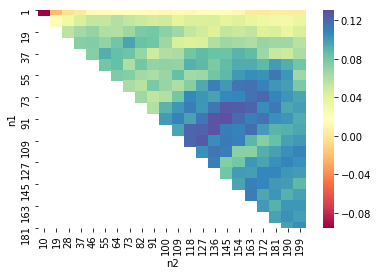

In [29]:
sns.heatmap(hmap, cmap='Spectral')

In [30]:
tr = hmap.stack()

In [31]:
n1 = [i[0] for i in tr.index]
n2 = [i[1] for i in tr.index]

In [32]:
val = []
for (i,j) in zip(n1,n2):
    if i<j:
        val.append(tr.loc[i,j])

In [33]:
import scipy.interpolate as interp
import numpy as np

px, py = np.meshgrid(np.linspace(np.min(n1),np.max(n1),100),np.linspace(np.min(n2),np.max(n2),100))
pz = interp.griddata((n1,n2),val,(px,py),method='cubic')

C:\Users\antho\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Z contains NaN values. This may result in rendering artifacts.
  
C:\Users\antho\Anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


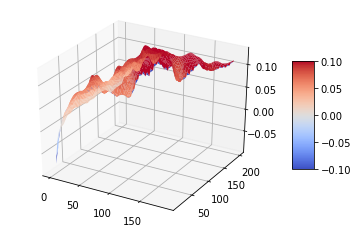

In [34]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_surface(px,py,pz,cmap=cm.coolwarm)
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.show()